In [20]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from matplotlib.pyplot import rc_context, rcParams


# sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
#                      frameon=False,
#                      color_map="YlGnBu", format='pdf', transparent=False,
#                      ipython_format='png2x', figsize=(8,8))

sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.0 pandas==1.5.2 scikit-learn==1.2.0 statsmodels==0.13.5 python-igraph==0.10.2 pynndescent==0.5.8


# Glioblastoma gene expression analysis 
* Load data
* Check quality metrics (mitochondrial RNA, number of counts detected, number of genes detected)
* Filter out low quality cells based on these metrics 
* Apply clustering ot the data 
* Vizualization of gene expression in the UMAP to understand the cell type populations

In [2]:
#adata = sc.read_h5ad('/mnt/ibm_lg/alejandro/multiome/glioblastoma/data/agg/adata_subset_GEX.h5ad')
adata = sc.read_h5ad('/mnt/ibm_lg/alejandro/multiome/glioblastoma/data/adata_subset_GEX.h5ad')

In [3]:
adata.obs

,site,donor
AAACAGCCAAACGGGC-16,cellrangerarc,B8
AAACAGCCAAACTGTT-10,cellrangerarc,B2
AAACAGCCAAATTGCT-15,cellrangerarc,B7
AAACAGCCAACAACAA-7,cellrangerarc,A7
AAACAGCCAACTAACT-11,cellrangerarc,B3
...,...,...
TTTGTTGGTTCCTGAT-7,cellrangerarc,A7
TTTGTTGGTTCGCTCA-4,cellrangerarc,A4
TTTGTTGGTTGGCGTG-2,cellrangerarc,A2
TTTGTTGGTTGTAAAC-21,cellrangerarc,S4


In [4]:
adata.var_names_make_unique()

In [5]:
adata.obs.rename(columns={'donor': 'sample'}, inplace=True)

In [6]:
adata.obs['sample_type'] = 'Brain'
adata.obs.loc[adata.obs['sample'].isin(['C2','C3']), 'sample_type'] = 'AC'
adata.obs.loc[adata.obs['sample'].isin(['S2','S3','S4']), 'sample_type'] = 'NS'


In [7]:
adata.obs['time'] = 'NA'
adata.obs.loc[adata.obs['sample'].isin(['A1','A2','A3','A4','A5','A6','A7','A8','A9']), 'time'] = '28d'
adata.obs.loc[adata.obs['sample'].isin(['B1','B2','B3','B4','B5','B6','B7','B8','B9']), 'time'] = '7d'


In [8]:
adata.obs['treatment'] = 'NA'
adata.obs.loc[adata.obs['sample'].isin(['A2','A5','A7','B1','B4','B9']), 'treatment'] = 'control'
adata.obs.loc[adata.obs['sample'].isin(['A1','A6','A9','B3','B7','B8']), 'treatment'] = 'peptide'
adata.obs.loc[adata.obs['sample'].isin(['A3','A4','A8','B2','B5','B6']), 'treatment'] = 'tmz'

In [9]:
# rename samples with technology
adata.obs['sample_t'] = ''
adata.obs.loc[adata.obs['sample']=='C2', 'sample_t'] = '10x nuclei AC-1'
adata.obs.loc[adata.obs['sample']=='C3', 'sample_t'] = '10x nuclei AC-2'
adata.obs.loc[adata.obs['sample']=='S2', 'sample_t'] = '10x nuclei NS-1'
adata.obs.loc[adata.obs['sample']=='S3', 'sample_t'] = '10x nuclei NS-2'
adata.obs.loc[adata.obs['sample']=='S4', 'sample_t'] = '10x nuclei NS-3'
adata.obs.loc[adata.obs['sample']=='A2', 'sample_t'] = '10x nuclei LateC-1'
adata.obs.loc[adata.obs['sample']=='A5', 'sample_t'] = '10x nuclei LateC-2'
adata.obs.loc[adata.obs['sample']=='A7', 'sample_t'] = '10x nuclei LateC-3'
adata.obs.loc[adata.obs['sample']=='A3', 'sample_t'] = '10x nuclei LateT-1'
adata.obs.loc[adata.obs['sample']=='A4', 'sample_t'] = '10x nuclei LateT-2'
adata.obs.loc[adata.obs['sample']=='A8', 'sample_t'] = '10x nuclei LateT-3'
adata.obs.loc[adata.obs['sample']=='A1', 'sample_t'] = '10x nuclei LateP-1'
adata.obs.loc[adata.obs['sample']=='A6', 'sample_t'] = '10x nuclei LateP-2'
adata.obs.loc[adata.obs['sample']=='A9', 'sample_t'] = '10x nuclei LateP-3'
adata.obs.loc[adata.obs['sample']=='B1', 'sample_t'] = '10x nuclei EarlyC-1'
adata.obs.loc[adata.obs['sample']=='B4', 'sample_t'] = '10x nuclei EarlyC-2'
adata.obs.loc[adata.obs['sample']=='B9', 'sample_t'] = '10x nuclei EarlyC-3'
adata.obs.loc[adata.obs['sample']=='B2', 'sample_t'] = '10x nuclei EarlyT-1'
adata.obs.loc[adata.obs['sample']=='B5', 'sample_t'] = '10x nuclei EarlyT-2'
adata.obs.loc[adata.obs['sample']=='B6', 'sample_t'] = '10x nuclei EarlyT-3'
adata.obs.loc[adata.obs['sample']=='B3', 'sample_t'] = '10x nuclei EarlyP-1'
adata.obs.loc[adata.obs['sample']=='B7', 'sample_t'] = '10x nuclei EarlyP-2'
adata.obs.loc[adata.obs['sample']=='B8', 'sample_t'] = '10x nuclei EarlyP-3'


In [10]:
# rename samples 
adata.obs['sample_r'] = ''
adata.obs.loc[adata.obs['sample']=='C2', 'sample_r'] = 'GL261-1'
adata.obs.loc[adata.obs['sample']=='C3', 'sample_r'] = 'GL261-2'
adata.obs.loc[adata.obs['sample']=='S2', 'sample_r'] = 'GSC-1'
adata.obs.loc[adata.obs['sample']=='S3', 'sample_r'] = 'GSC-2'
adata.obs.loc[adata.obs['sample']=='S4', 'sample_r'] = 'GSC-3'
adata.obs.loc[adata.obs['sample']=='A2', 'sample_r'] = 'LateC-1'
adata.obs.loc[adata.obs['sample']=='A5', 'sample_r'] = 'LateC-2'
adata.obs.loc[adata.obs['sample']=='A7', 'sample_r'] = 'LateC-3'
adata.obs.loc[adata.obs['sample']=='A3', 'sample_r'] = 'LateT-1'
adata.obs.loc[adata.obs['sample']=='A4', 'sample_r'] = 'LateT-2'
adata.obs.loc[adata.obs['sample']=='A8', 'sample_r'] = 'LateT-3'
adata.obs.loc[adata.obs['sample']=='A1', 'sample_r'] = 'LateP-1'
adata.obs.loc[adata.obs['sample']=='A6', 'sample_r'] = 'LateP-2'
adata.obs.loc[adata.obs['sample']=='A9', 'sample_r'] = 'LateP-3'
adata.obs.loc[adata.obs['sample']=='B1', 'sample_r'] = 'EarlyC-1'
adata.obs.loc[adata.obs['sample']=='B4', 'sample_r'] = 'EarlyC-2'
adata.obs.loc[adata.obs['sample']=='B9', 'sample_r'] = 'EarlyC-3'
adata.obs.loc[adata.obs['sample']=='B2', 'sample_r'] = 'EarlyT-1'
adata.obs.loc[adata.obs['sample']=='B5', 'sample_r'] = 'EarlyT-2'
adata.obs.loc[adata.obs['sample']=='B6', 'sample_r'] = 'EarlyT-3'
adata.obs.loc[adata.obs['sample']=='B3', 'sample_r'] = 'EarlyP-1'
adata.obs.loc[adata.obs['sample']=='B7', 'sample_r'] = 'EarlyP-2'
adata.obs.loc[adata.obs['sample']=='B8', 'sample_r'] = 'EarlyP-3'


In [11]:
# Compute QC metrics
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

### Histogram of total counts detected 
We see a bimodal distribution with a fraction of cells having very low number of counts (less than 1000) 

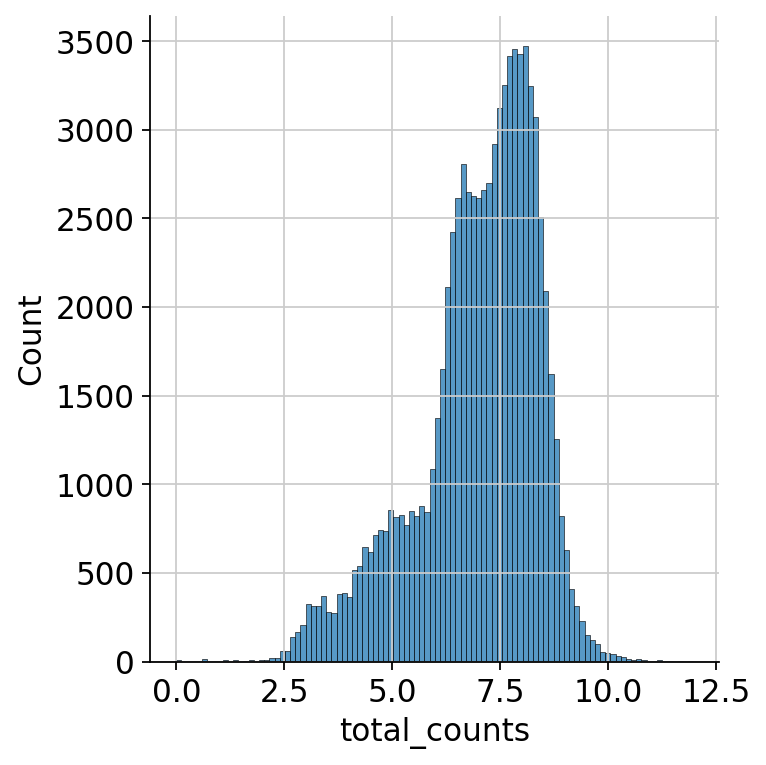

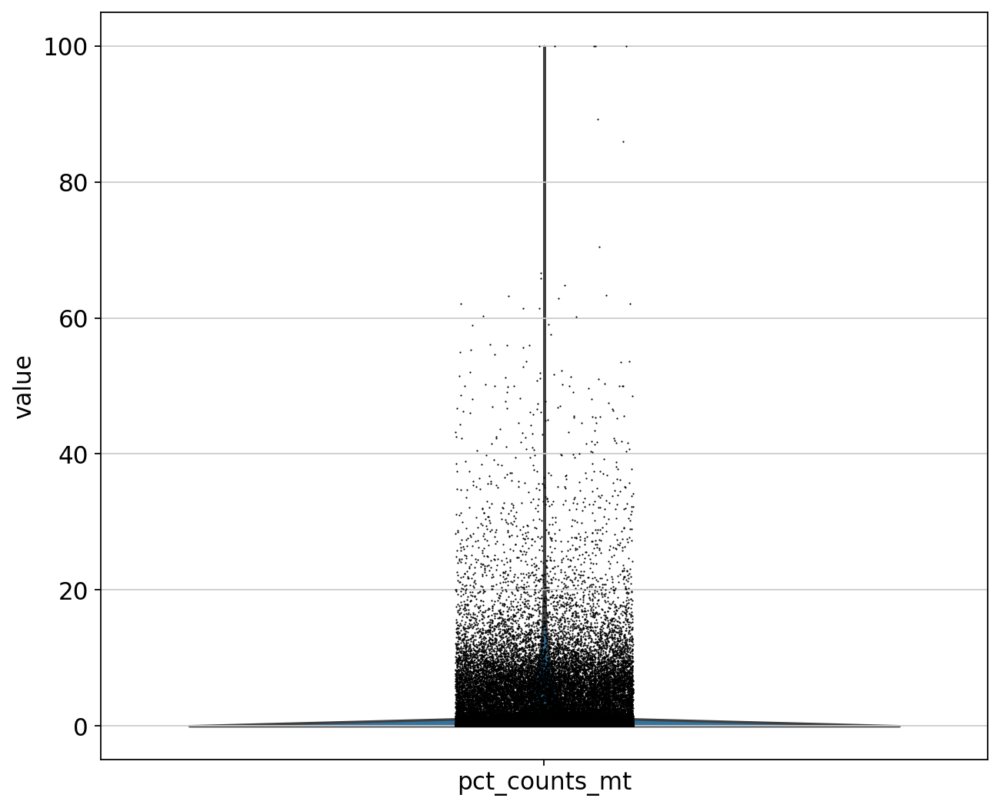

In [12]:
t1 = sns.displot(np.log1p(adata.obs['total_counts']), bins=100, kde=False)
t2 = sc.pl.violin(adata, 'pct_counts_mt')

### We can visualize multiple QC metrics at the same time 
The most important metrics are total_counts, n_genes_by_counts and pct_counts_mt. We can look at them in the same plot. 

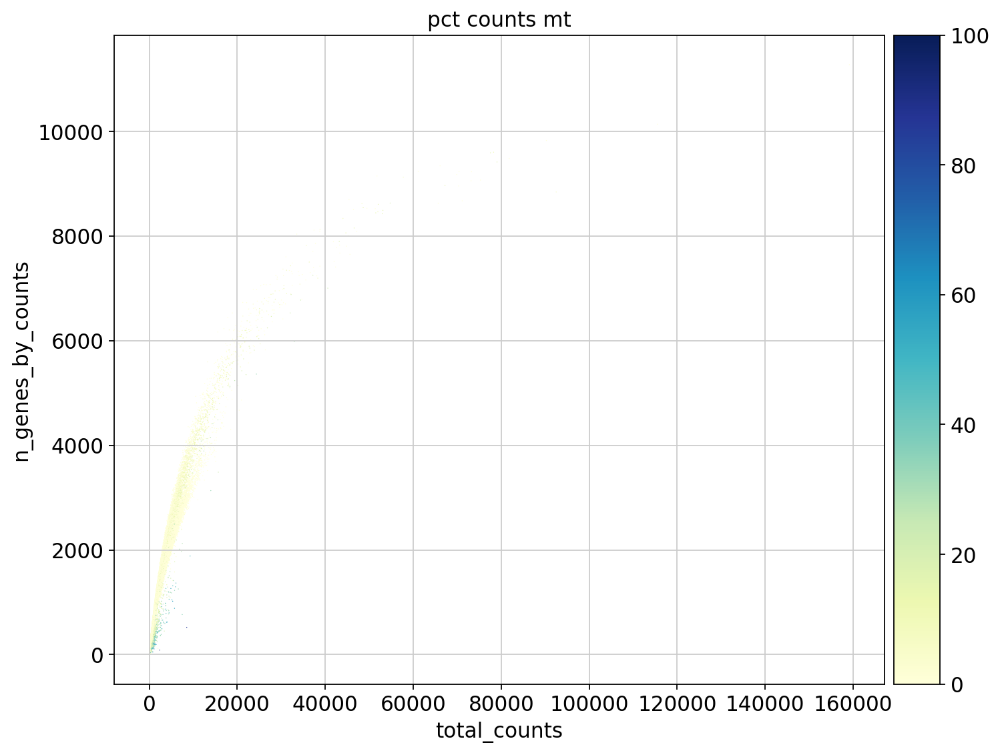

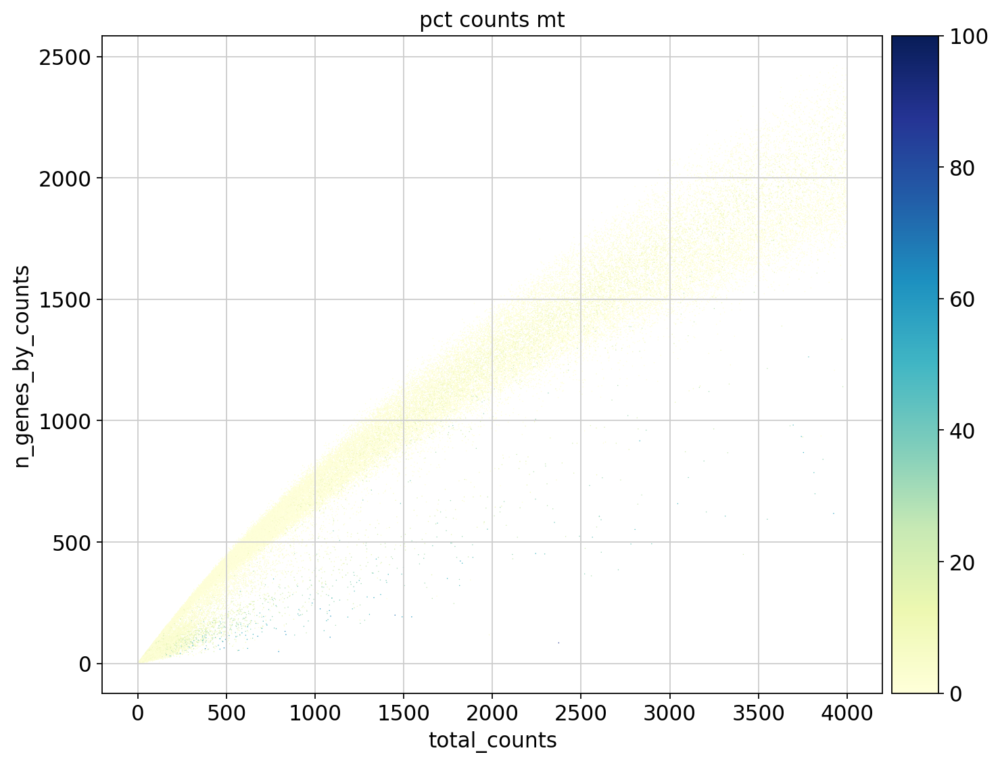

In [13]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')
p2 = sc.pl.scatter(adata[adata.obs['total_counts']<4000], 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')

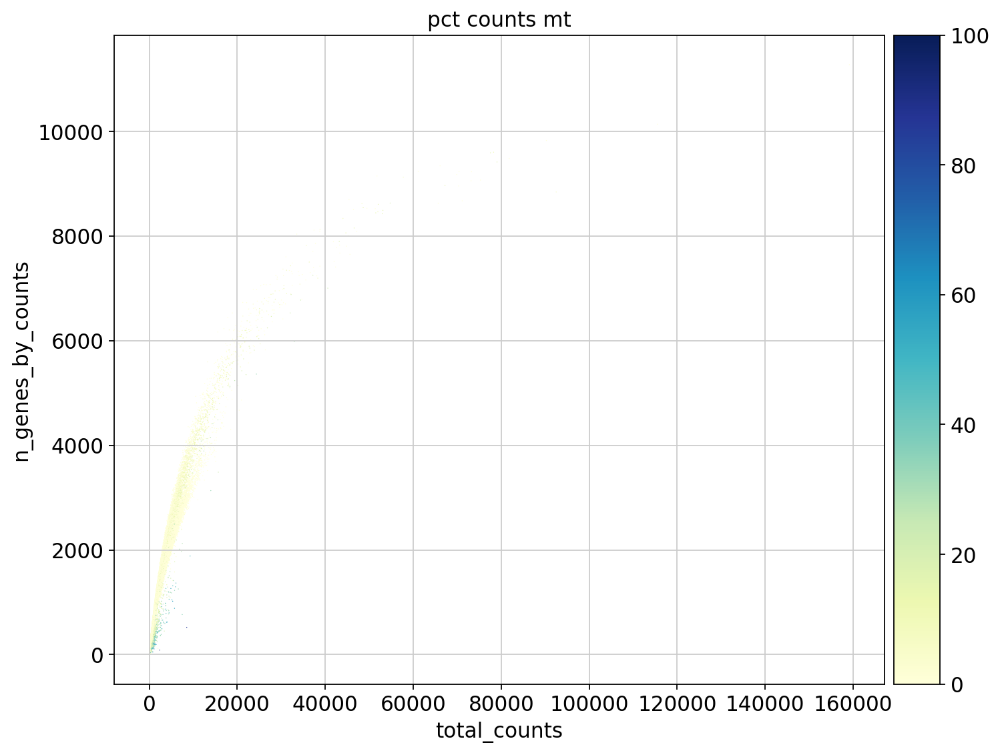

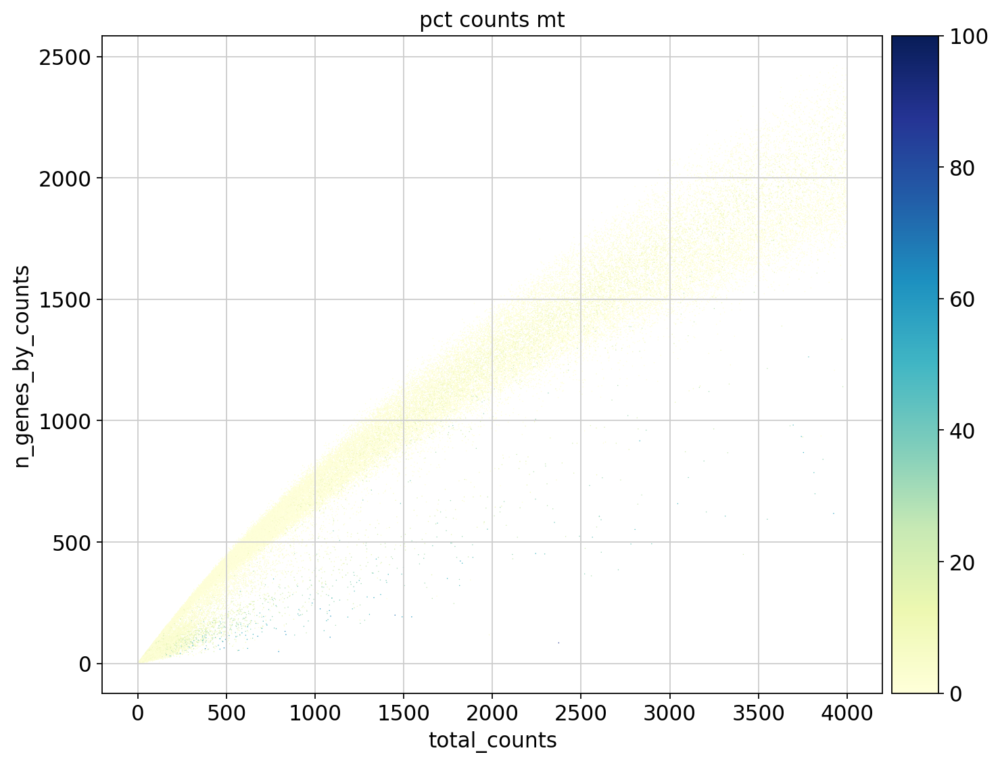

In [14]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')
p2 = sc.pl.scatter(adata[adata.obs['total_counts']<4000], 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')

In [15]:
adata.obs.head()

,site,sample,sample_type,time,treatment,sample_t,sample_r,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
AAACAGCCAAACGGGC-16,cellrangerarc,B8,Brain,7d,peptide,10x nuclei EarlyP-3,EarlyP-3,1639,7.402452,2948.0,7.989222,24.423338,31.852103,42.333786,61.363636,10.0,2.397895,0.339213
AAACAGCCAAACTGTT-10,cellrangerarc,B2,Brain,7d,tmz,10x nuclei EarlyT-1,EarlyT-1,643,6.467699,922.0,6.827629,28.091106,38.937093,51.952278,84.490239,0.0,0.000000,0.000000
AAACAGCCAAATTGCT-15,cellrangerarc,B7,Brain,7d,peptide,10x nuclei EarlyP-2,EarlyP-2,293,5.683580,354.0,5.872118,31.355932,45.480226,73.728814,100.000000,0.0,0.000000,0.000000
AAACAGCCAACAACAA-7,cellrangerarc,A7,Brain,28d,control,10x nuclei LateC-3,LateC-3,1582,7.367077,2217.0,7.704361,15.922418,22.553000,31.574199,51.195309,1.0,0.693147,0.045106
AAACAGCCAACTAACT-11,cellrangerarc,B3,Brain,7d,peptide,10x nuclei EarlyP-1,EarlyP-1,1341,7.201916,2498.0,7.823646,24.299440,33.947158,46.076861,66.333066,1.0,0.693147,0.040032


In [16]:
import re
[print(x) for x in adata.var.index.to_list() if x.startswith('mch') ]

mcherry


[None]

### Let's zoom into the distribution of total counts by cells
For quality control, we want to exclude cells with low (or too high) number of counts. Looking at the distribution should help us understand were to draw the cut-offs

/tmp/ipykernel_69171/1383855640.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  p3 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']<8000], kde=False, bins=60)


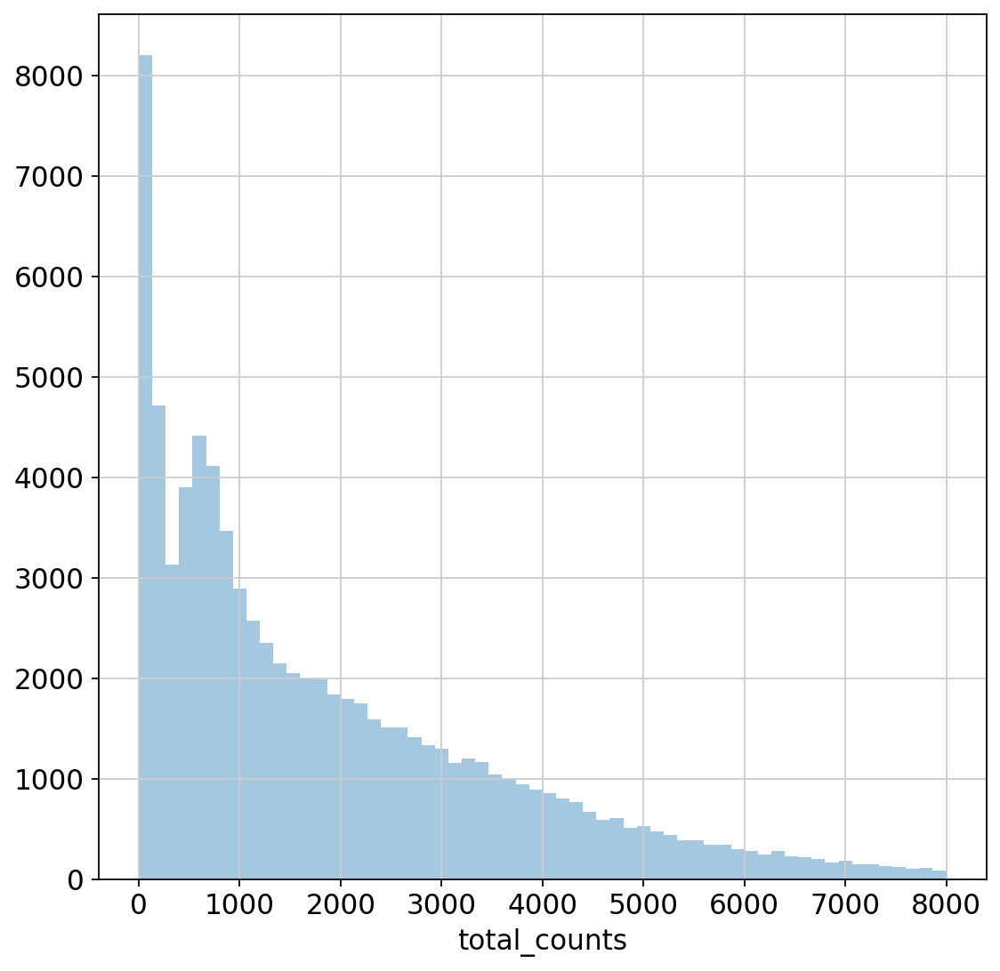

/tmp/ipykernel_69171/1383855640.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  p4 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']<2000], kde=False, bins=60)


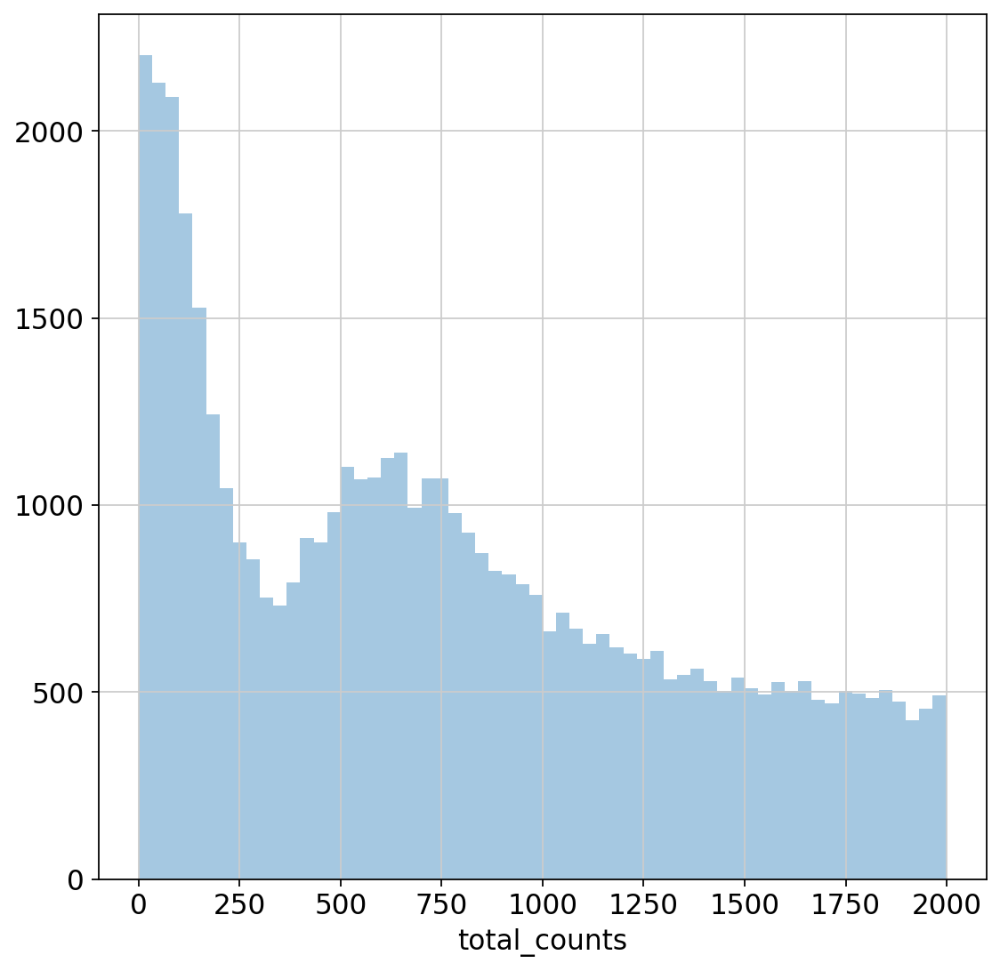

/tmp/ipykernel_69171/1383855640.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  p5 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']>10000], kde=False, bins=60)


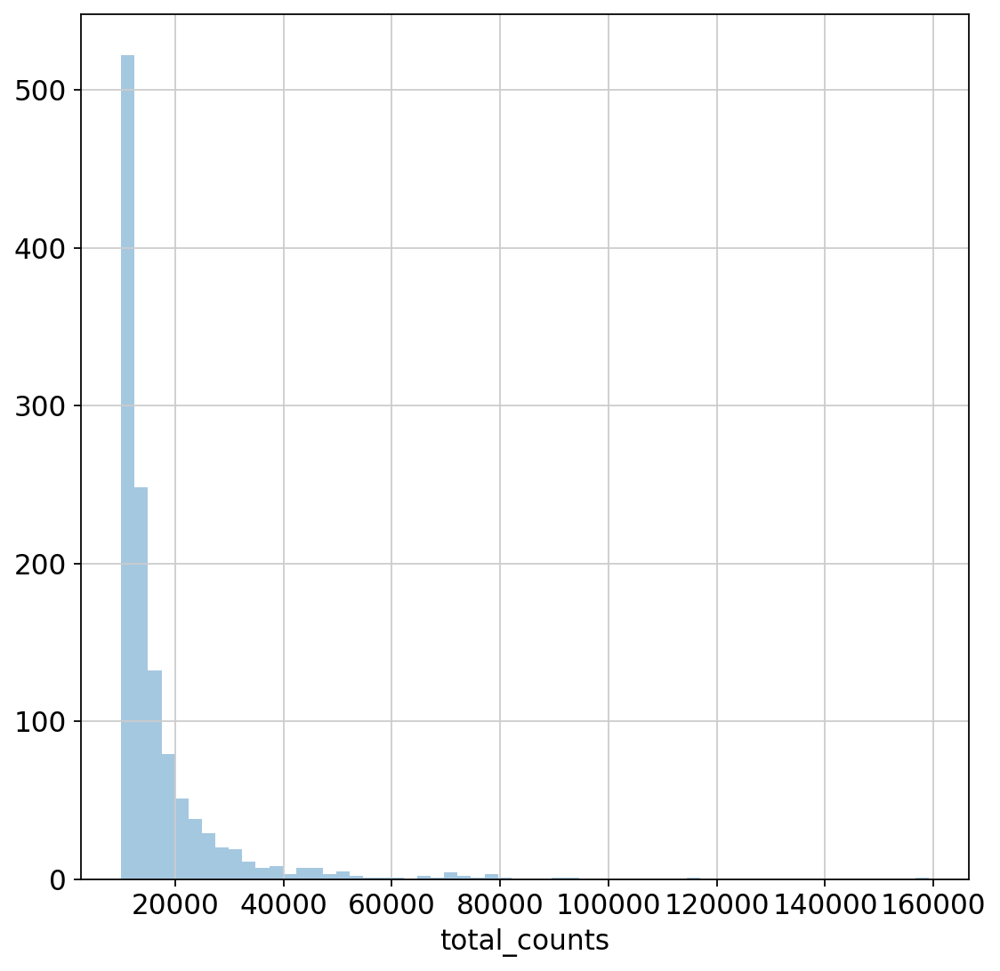

/tmp/ipykernel_69171/1383855640.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  p6 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']>20000], kde=False, bins=60)


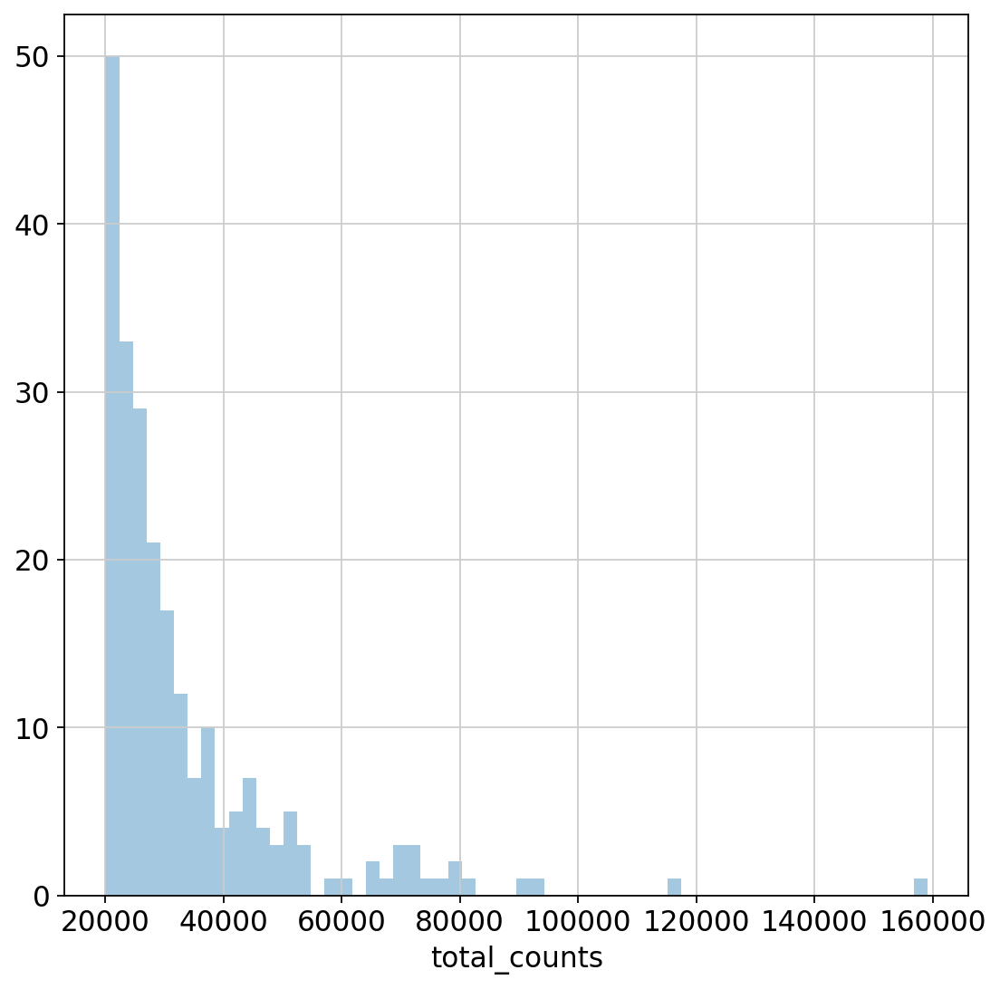

In [17]:
#Thresholding decision: counts
# Here we check the univariate distributions for low-quality outlier peaks. We especially zoom in on lower values
p3 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']<8000], kde=False, bins=60)
plt.show()

p4 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']<2000], kde=False, bins=60)
plt.show()

p5 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']>10000], kde=False, bins=60)
plt.show()

p6 = sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']>20000], kde=False, bins=60)
plt.show()

In [19]:
np.median(adata.obs['n_genes_by_counts'])

946.0

Thresholding options:

Lower bound:
- 250 -> use this
- 500 
- 1100

Upper bound:
- 25,000 go for this
- 32,000
- 50,000  

/tmp/ipykernel_69171/935140850.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  p7 = sns.distplot(adata.obs['n_genes_by_counts'], kde=False, bins=60)


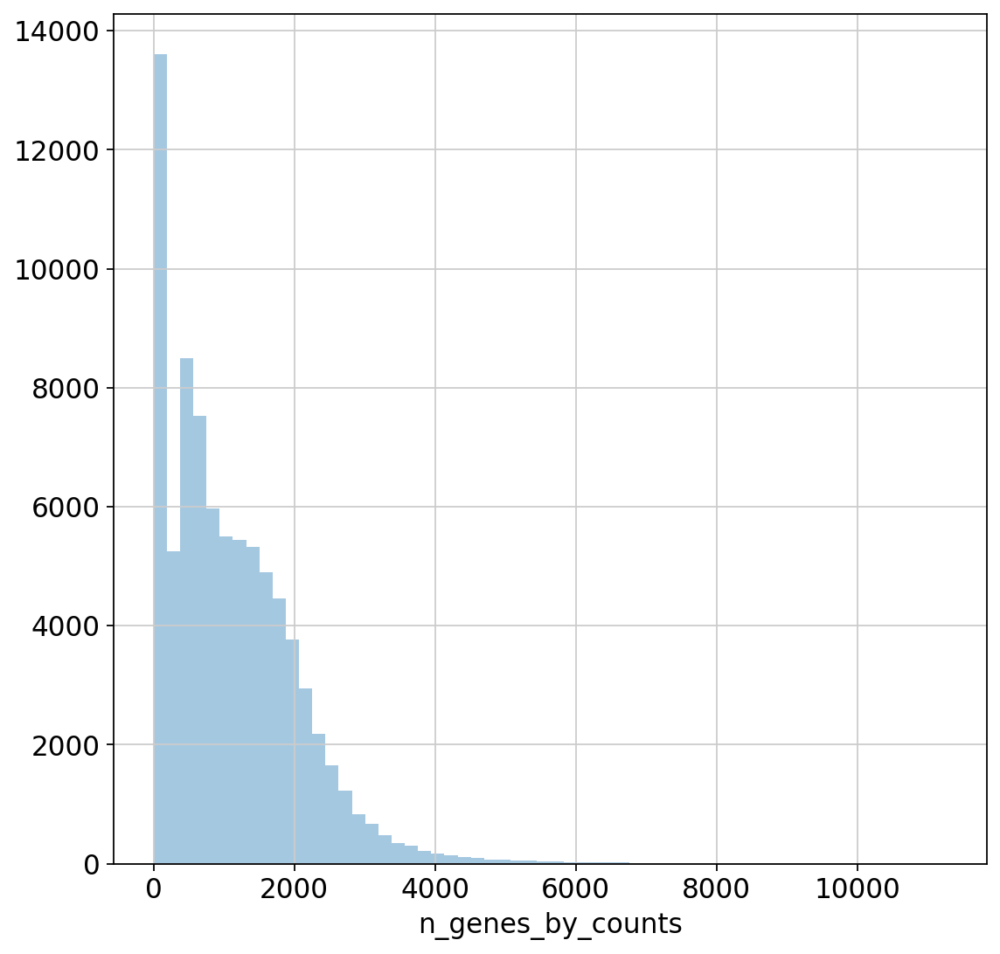

/tmp/ipykernel_69171/935140850.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  p8 = sns.distplot(adata.obs['n_genes_by_counts'][adata.obs['n_genes_by_counts']<1000], kde=False, bins=60)


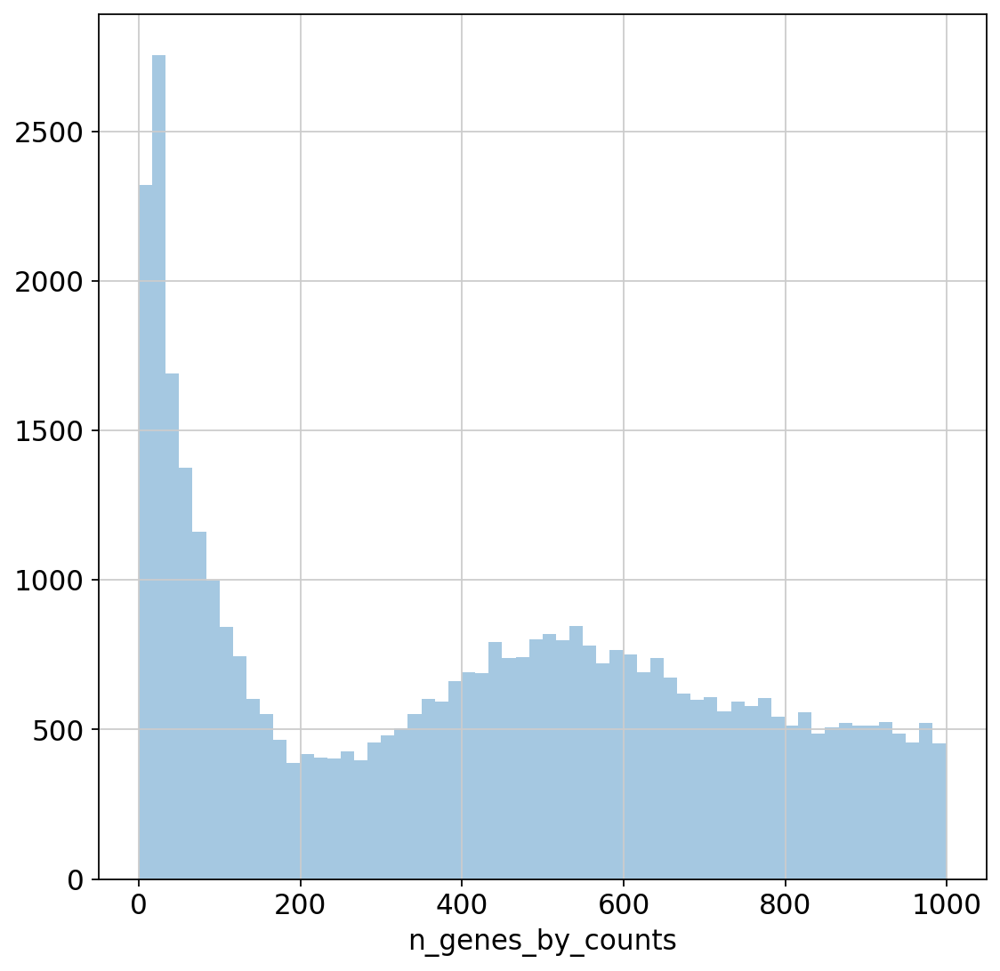

In [20]:
#Thresholding decision: genes
p7 = sns.distplot(adata.obs['n_genes_by_counts'], kde=False, bins=60)
plt.show()

p8 = sns.distplot(adata.obs['n_genes_by_counts'][adata.obs['n_genes_by_counts']<1000], kde=False, bins=60)
plt.show()

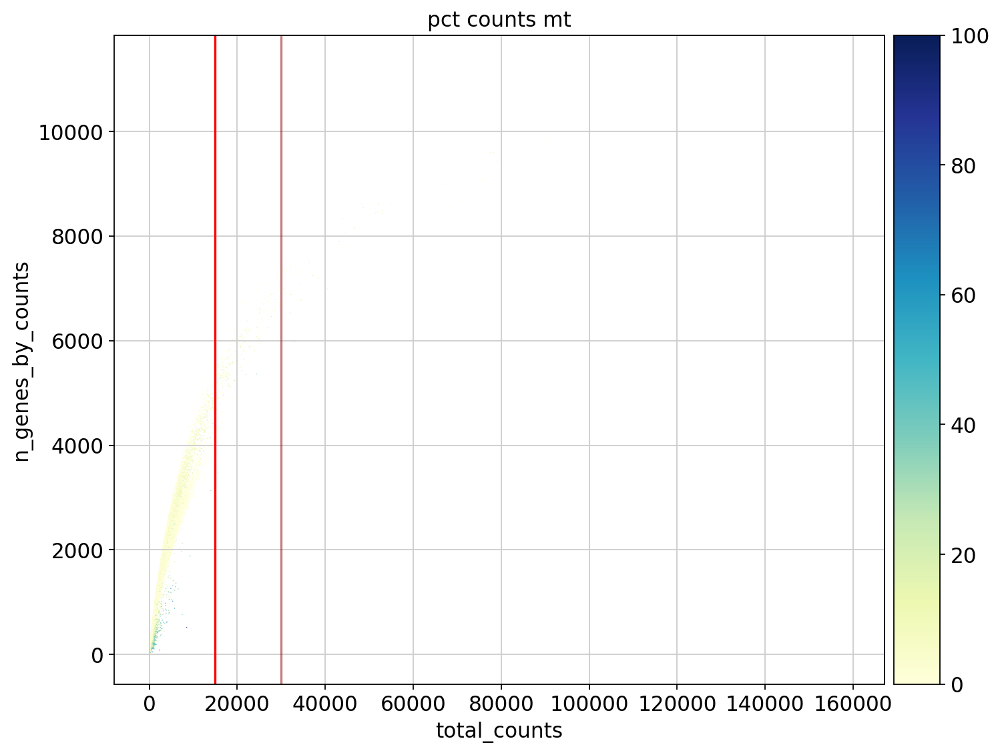

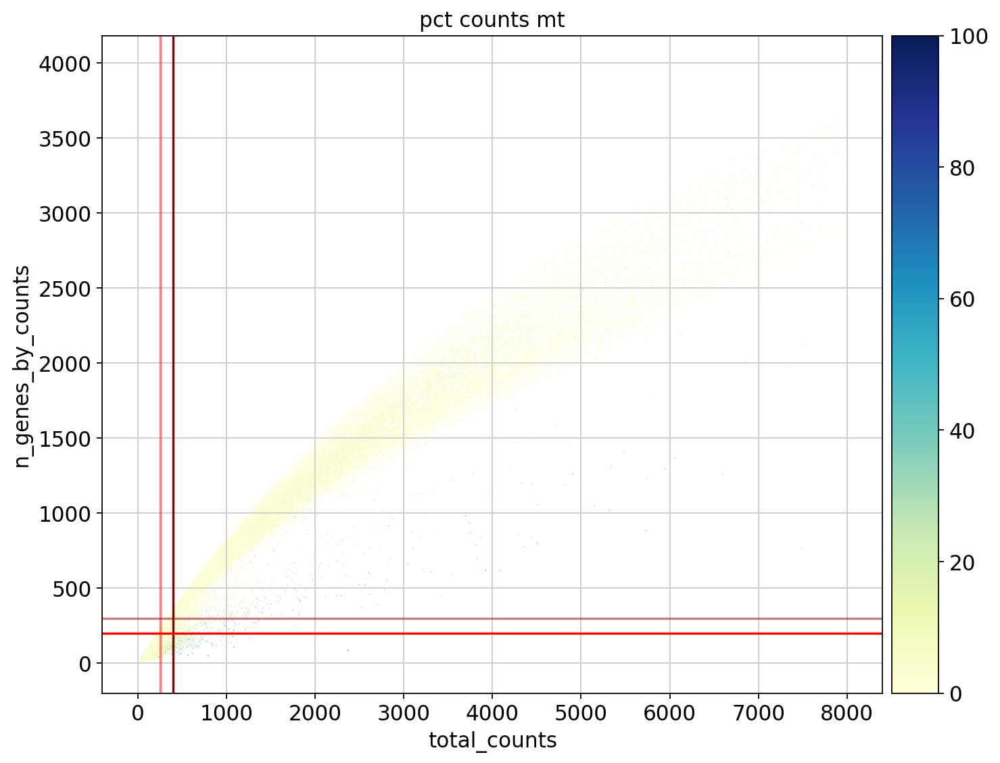

In [21]:
# Visualize the chosen thresholds jointly, before filtering out cells
counts_upper = 15000
counts_upper_alt = 30000
counts_lower = 250
counts_lower_alt = 400
genes_lower = 200
genes_lower_alt = 300

p9 = sc.pl.scatter(adata, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt', show=False)
p9.axline((counts_upper,0),(counts_upper,1), color='red')
p9.axline((counts_upper_alt,0),(counts_upper_alt,1), color='darkred', alpha=0.5)
plt.show()

count_lim = 8000
p10 = sc.pl.scatter(adata[adata.obs['total_counts']<count_lim], 'total_counts', 'n_genes_by_counts', color='pct_counts_mt', show=False)
p10.axline((counts_lower,0),(counts_lower,1), color='red', alpha=0.5)
p10.axline((counts_lower_alt,0),(counts_lower_alt,1), color='darkred')
p10.axline((0,genes_lower),(1,genes_lower), color='red')
p10.axline((0,genes_lower_alt),(1,genes_lower_alt), color='darkred', alpha=0.5)
plt.show()

### Filter cells using our cut-offs

In [22]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 375)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 10000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 250)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 82152
Number of cells after min count filter: 66708
Number of cells after max count filter: 65496
Number of cells after gene filter: 64716


In [23]:
adata = adata[adata.obs['pct_counts_mt']< 10].copy() 

In [24]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 32286
Number of genes after cell filter: 21357


In [25]:
pwd

'/mnt/ibm_lg/laura.garcia/glioblastoma/analysis/mcherry_alignment/multiome'

In [26]:
adata.layers["counts"] = adata.X.copy()


In [27]:
adata.write('./data/3GEX_filt.h5ad')

### Clustering 
Final number of cells after quality control: 19k 

In [ ]:
adata = sc.read('./data/3GEX_filt.h5ad')

In [28]:
#sc.pp.normalize_per_cell(adata_gex, counts_per_cell_after=1e6)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.scale(adata, max_value=10)


 Number of highly variable genes: 4000


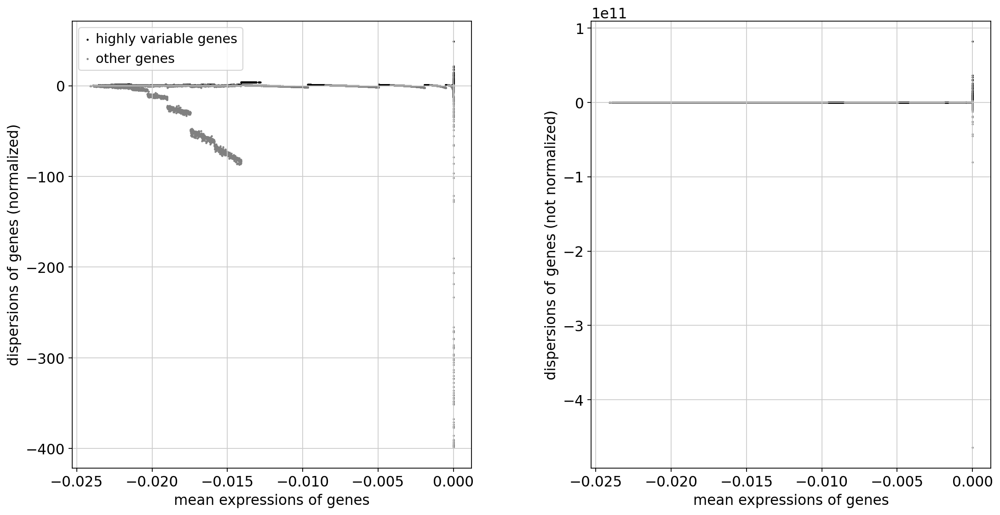

In [29]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))
sc.pl.highly_variable_genes(adata)

In [30]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=15, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added='leiden')

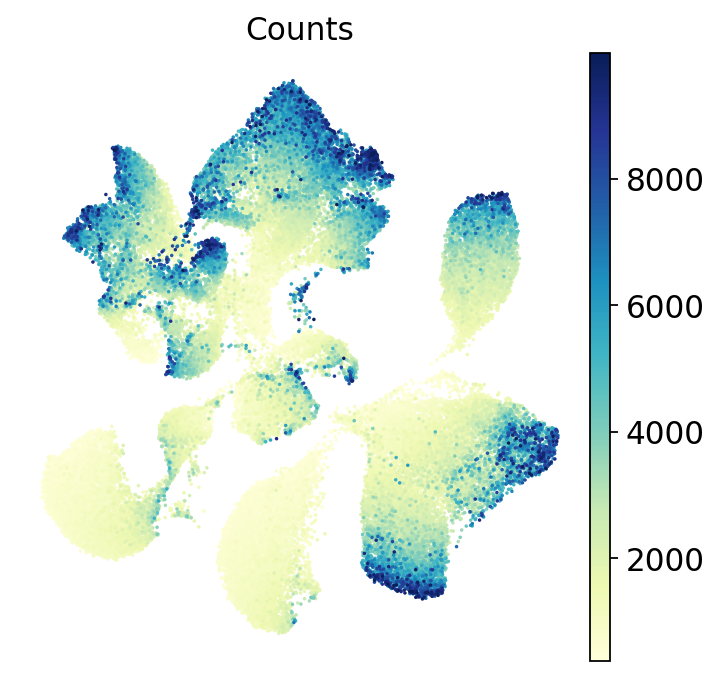

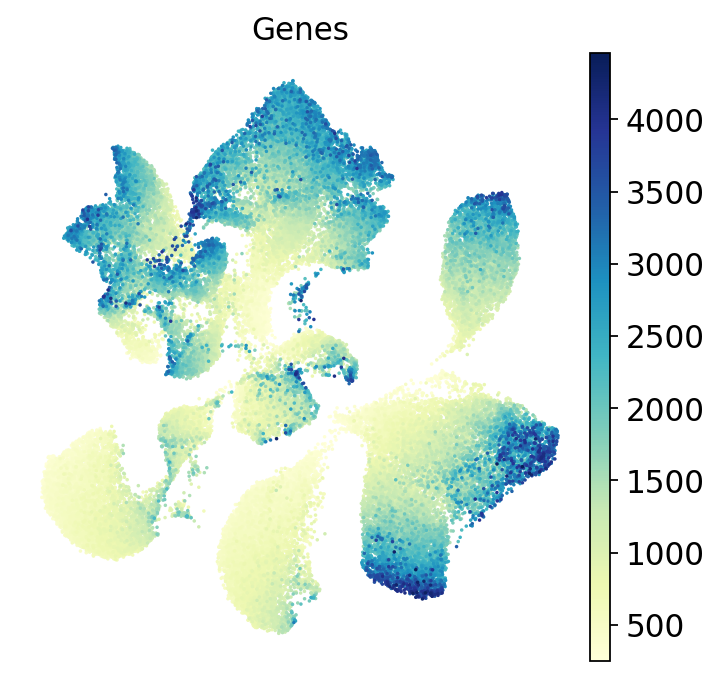

In [31]:
with rc_context({'font.size': 20.0, 'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color=['total_counts'], size=10, title='Counts')
    sc.pl.umap(adata, color=['n_genes_by_counts'], size=10, title='Genes')

In [ ]:
# sc.pl.umap(adata, color=['Ptprc','Mbp','Cd3e', 'mcherry'], size=30)

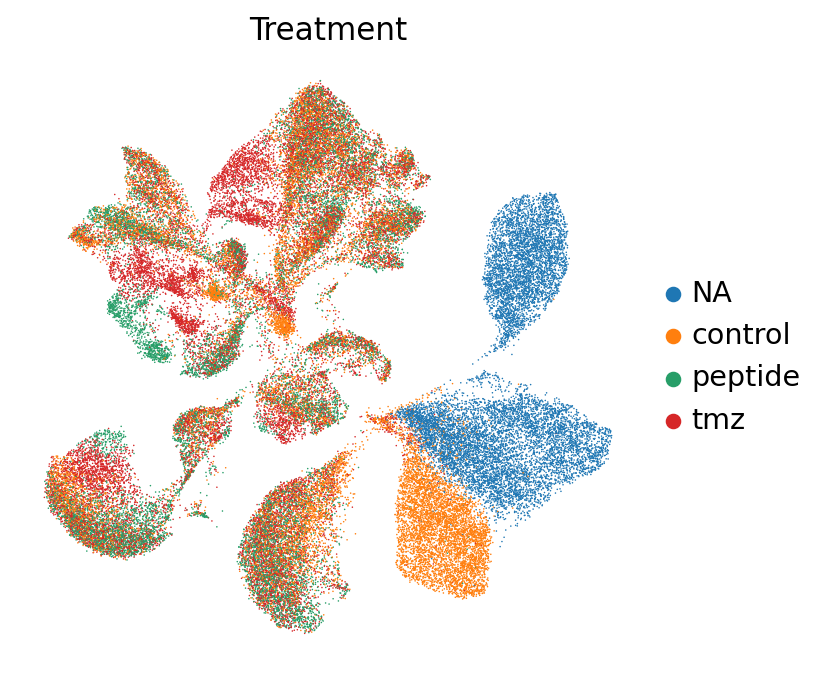

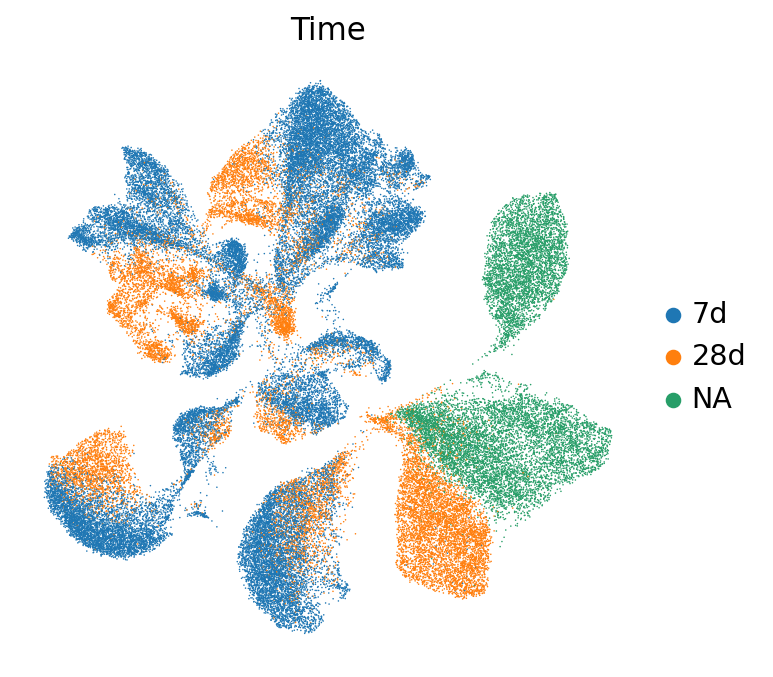

In [51]:
with rc_context({'font.size': 20.0, 'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color=['treatment'], title='Treatment')
    sc.pl.umap(adata, color=['time'], title='Time')

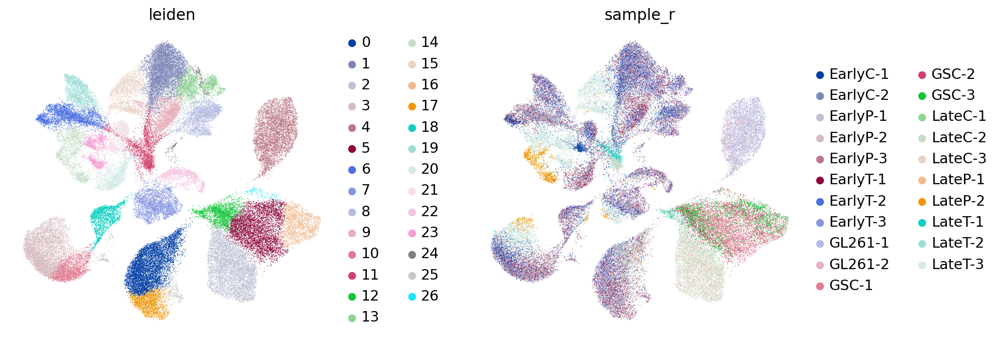

In [32]:
with rc_context({'font.size': 20.0, 'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color=['leiden', 'sample_r'], wspace=0.3)

In [47]:
adata.obs['sample_r'].value_counts()

EarlyP-2    5554
LateT-3     5156
EarlyT-1    5154
EarlyC-2    4727
EarlyP-3    4499
EarlyC-1    4451
LateC-3     4207
LateC-2     3886
EarlyT-3    3774
EarlyP-1    3365
GL261-1     3333
GSC-1       3198
EarlyT-2    2728
GSC-3       2289
GSC-2       1782
LateP-2     1314
LateT-2     1109
GL261-2      960
LateT-1      648
LateC-1      118
LateP-1        2
Name: sample_r, dtype: int64

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


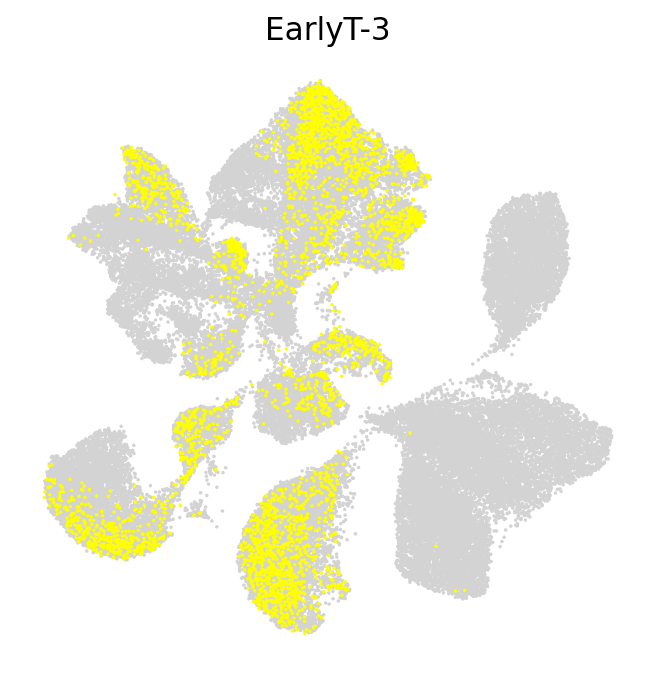

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


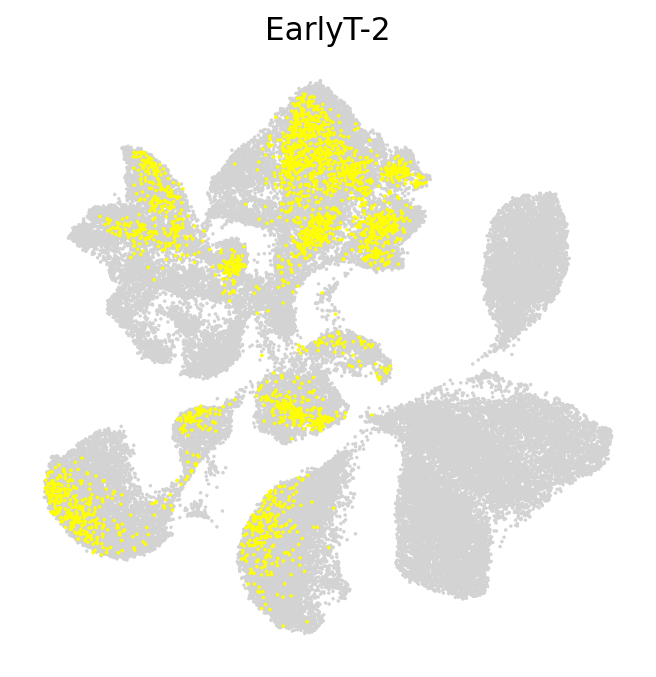

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


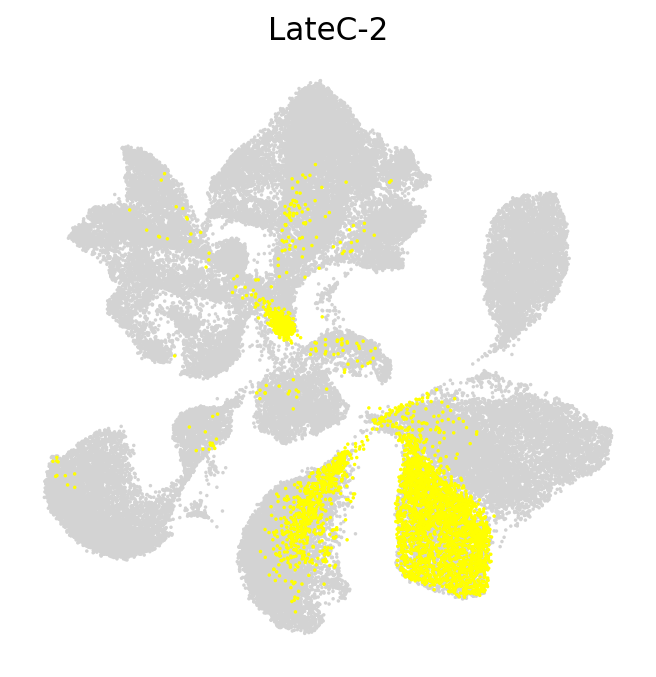

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


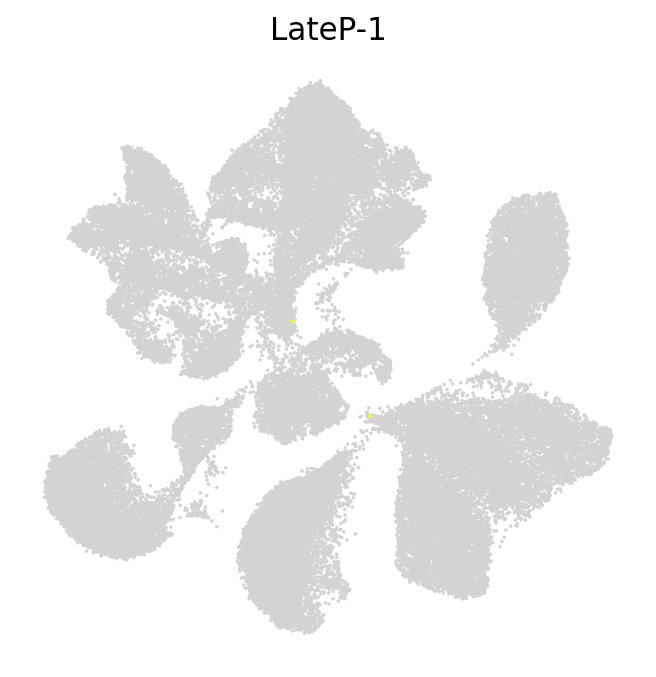

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


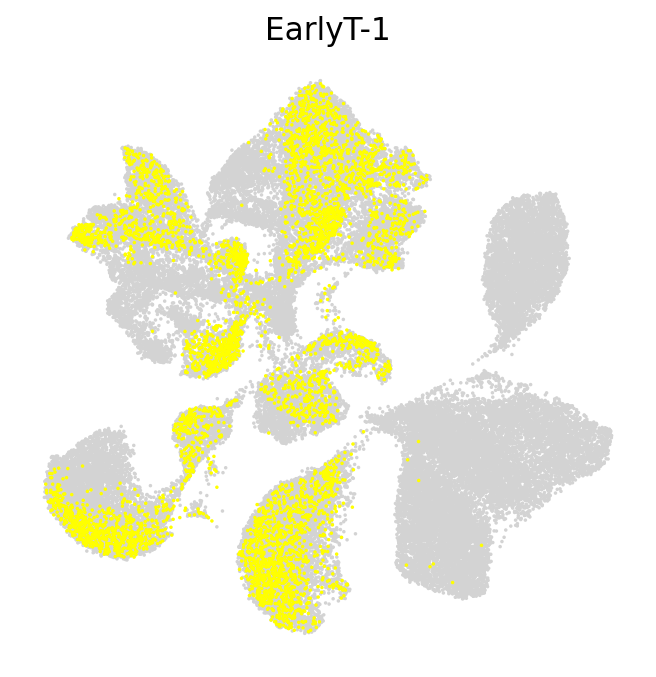

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


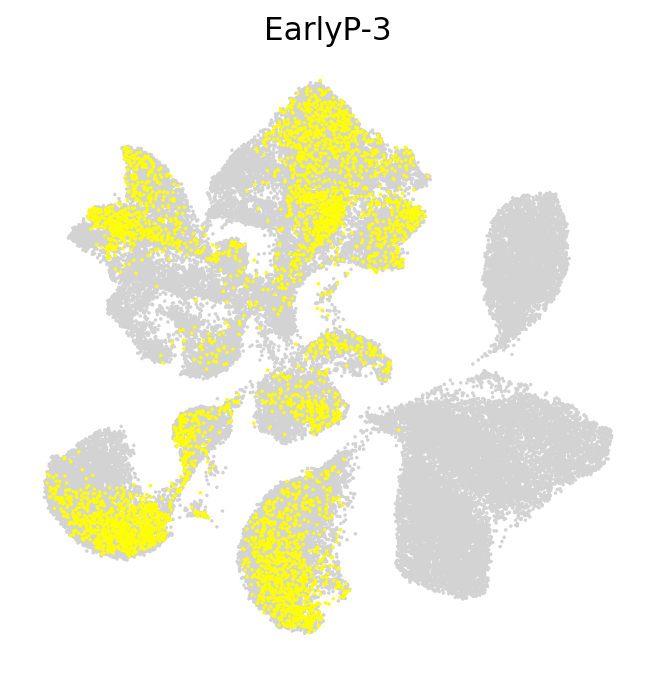

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


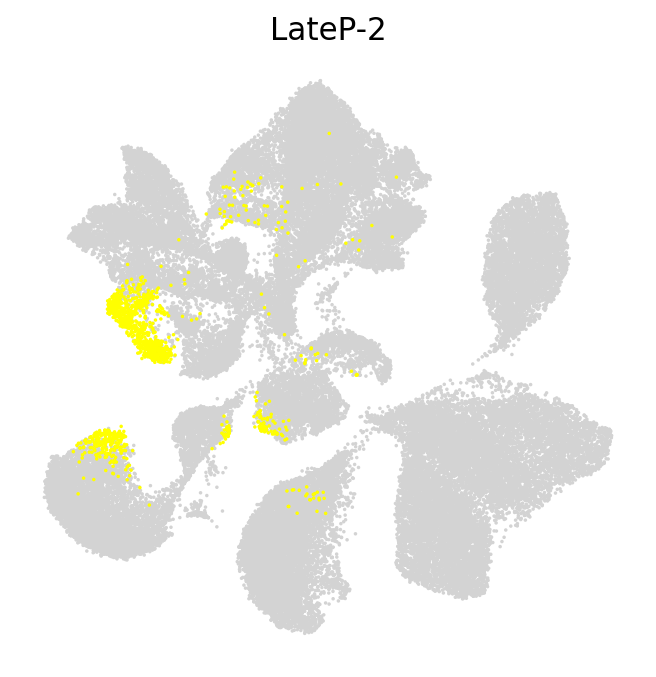

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


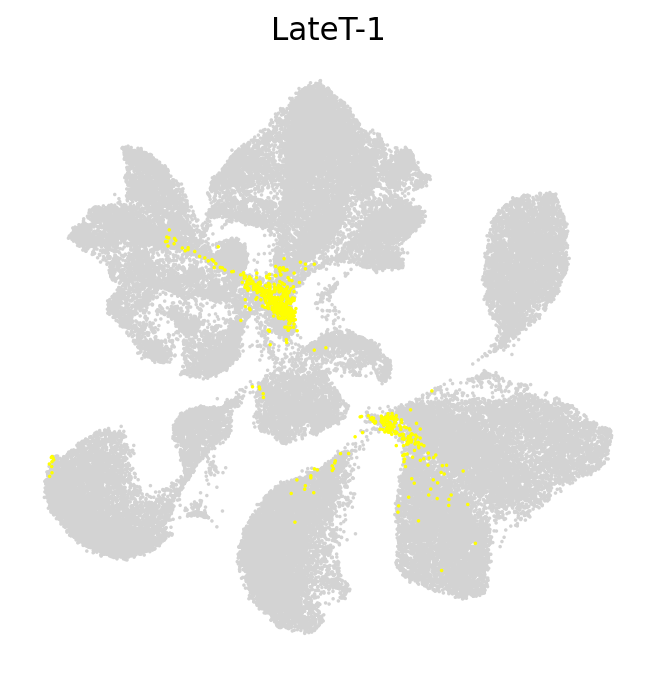

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


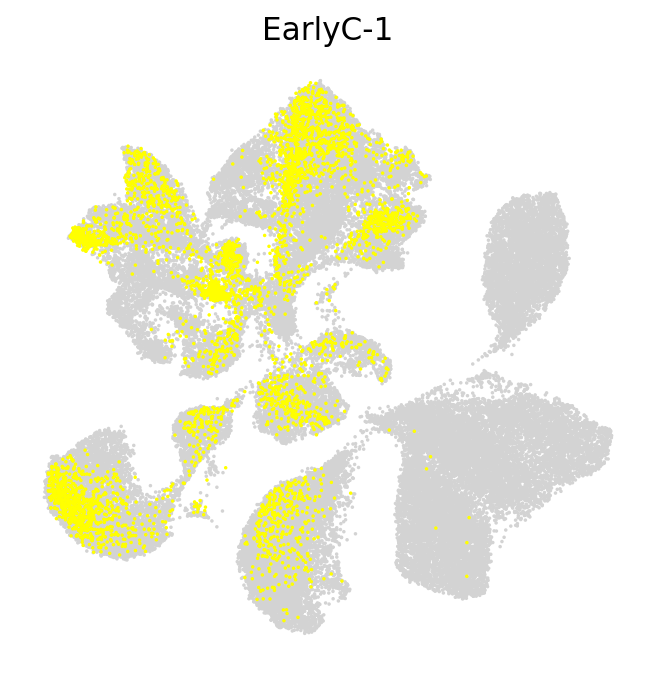

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


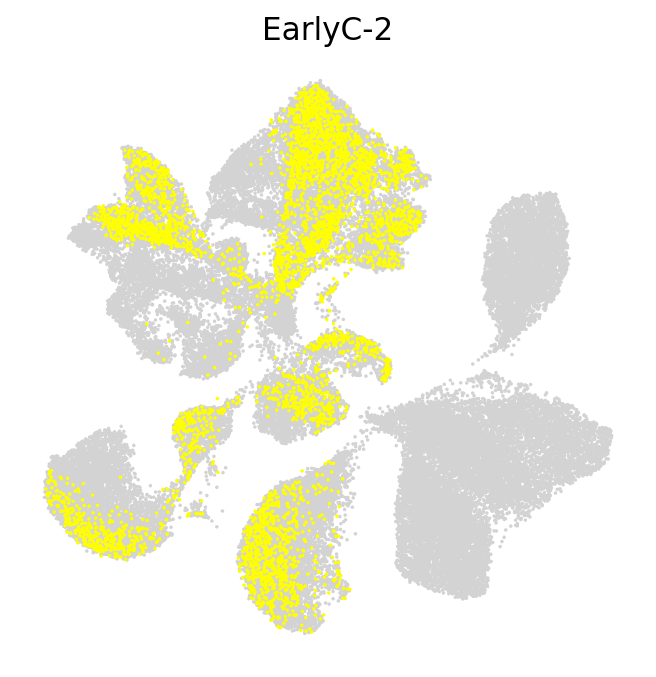

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


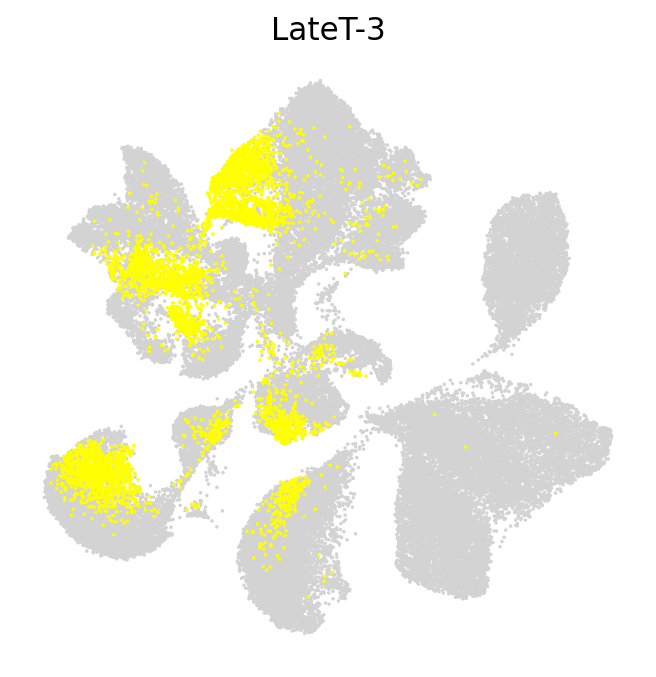

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


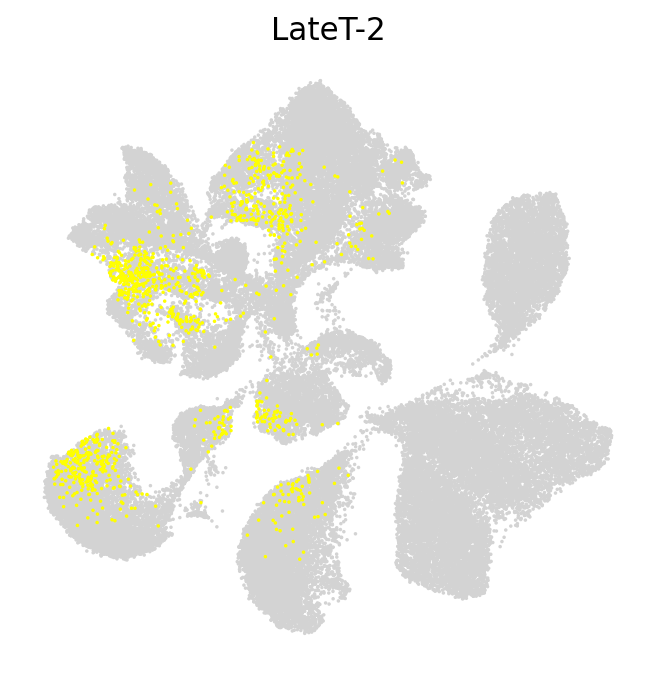

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


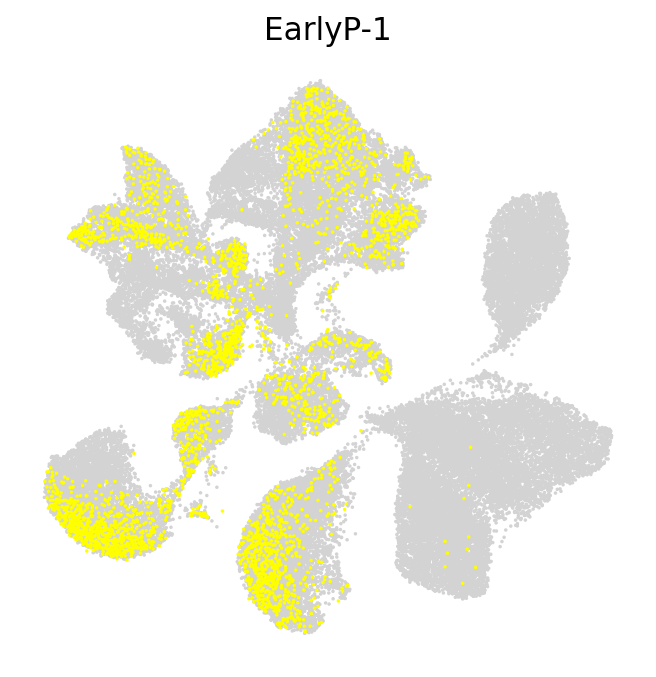

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


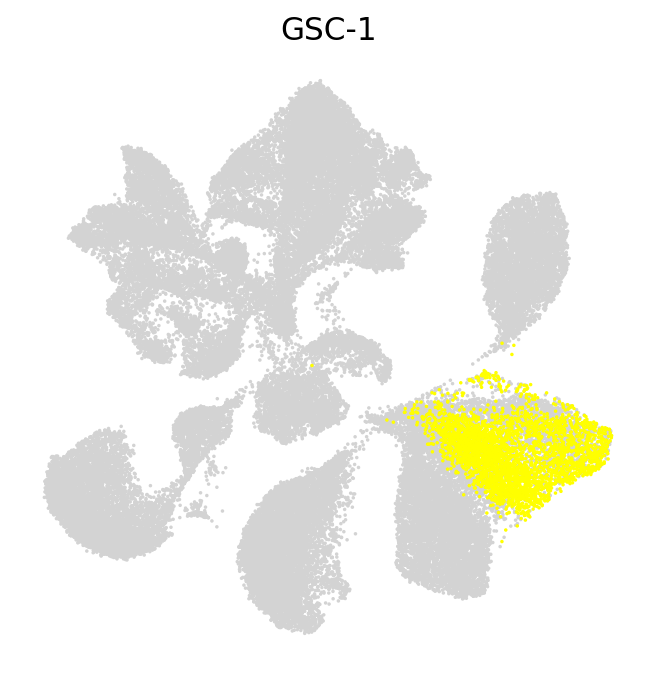

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


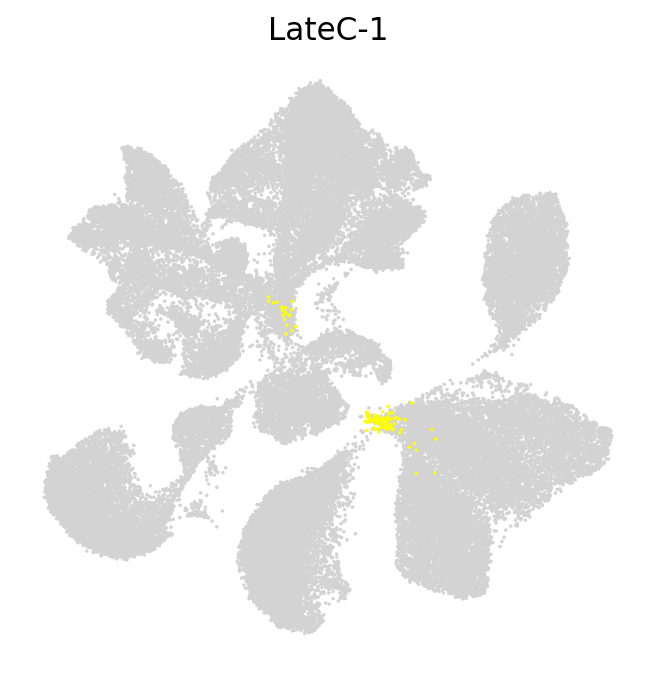

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


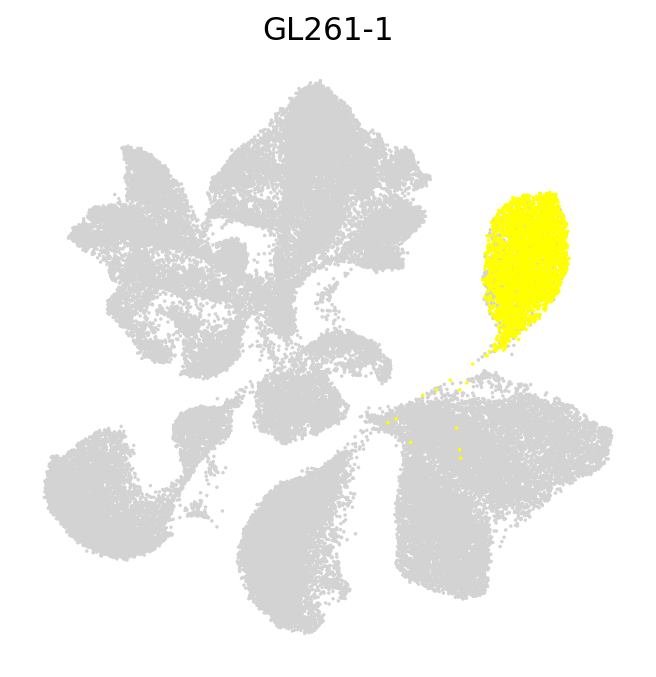

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


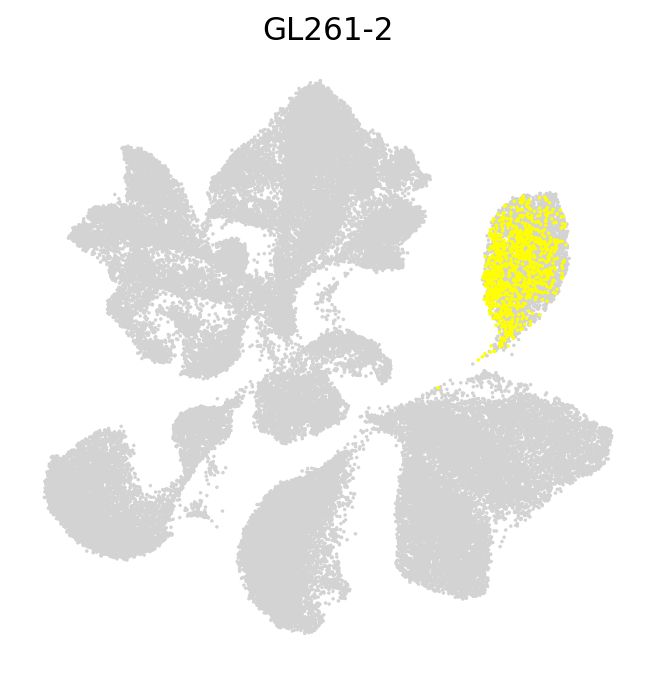

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


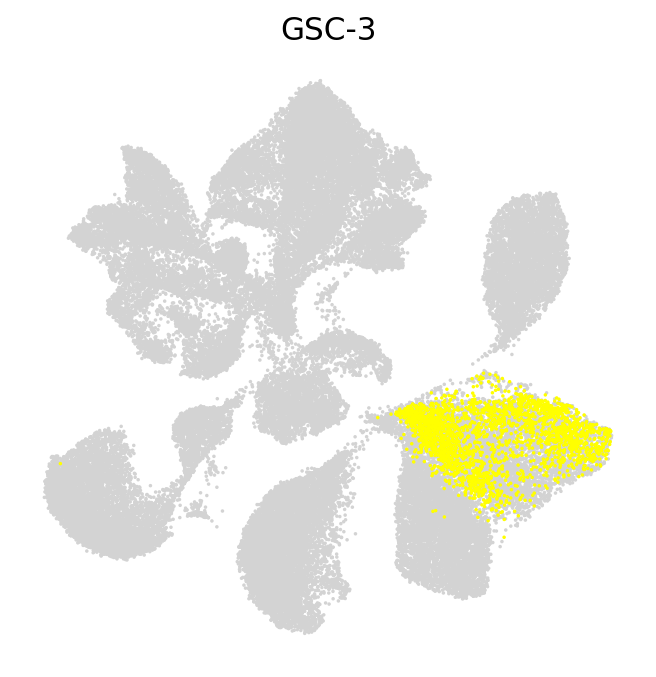

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


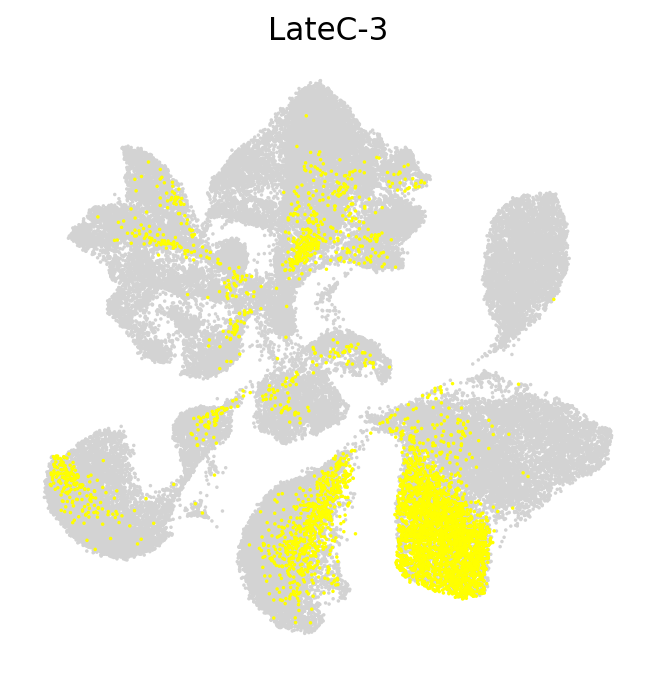

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


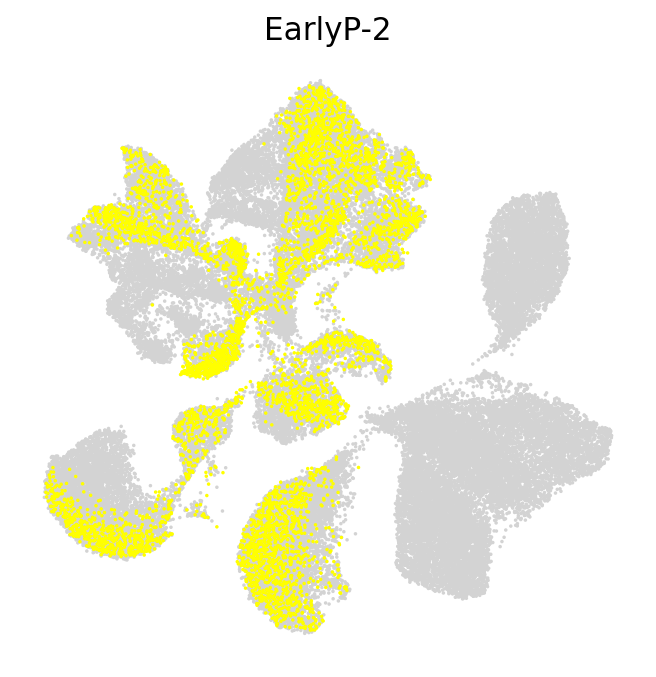

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


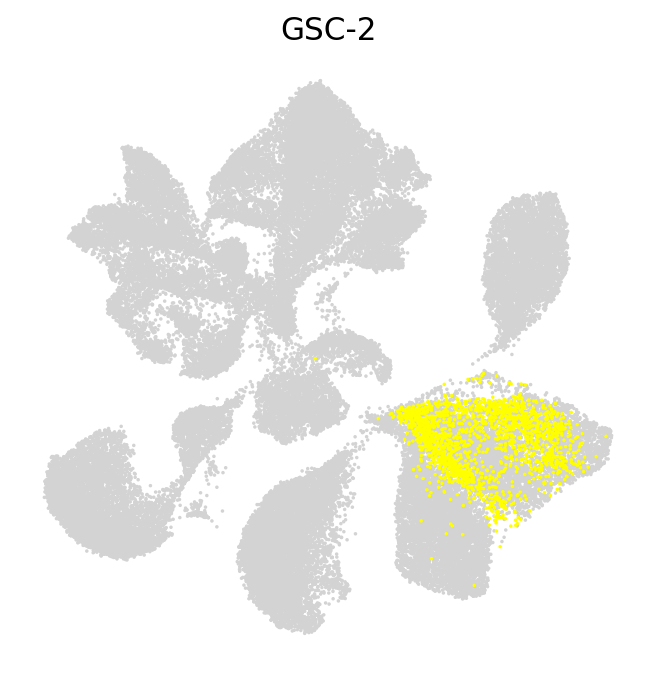

In [46]:
with rc_context({'font.size': 20.0, 'figure.figsize': (5, 5)}):
    for sample in set(adata.obs['sample_r']):
        sc.pl.umap(adata, color='sample_r', groups=[sample], size=10,  
                   title=sample, legend_loc=None, palette=['yellow'], frameon=False)
        

Doublet detection

In [52]:
test_dat = adata.copy()
test_dat.X = adata.layers["counts"].copy()

In [53]:
sc.external.pp.scrublet(test_dat)

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.24
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 49.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.0%


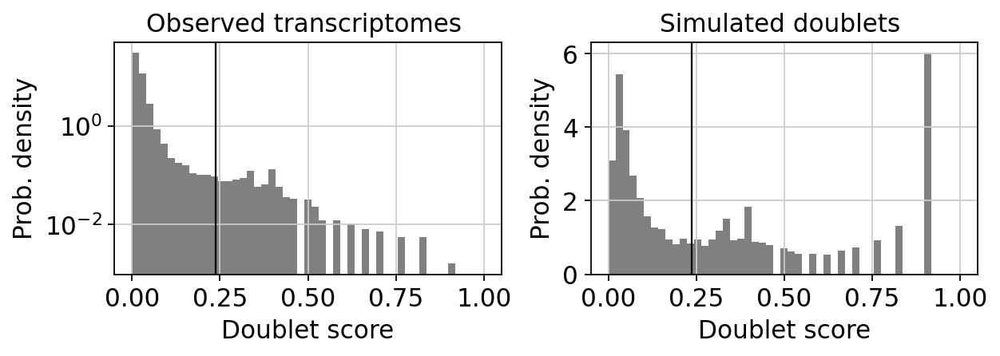

In [54]:
sc.external.pl.scrublet_score_distribution(test_dat)

In [55]:
adata.obs['doublet_score'] = test_dat.obs['doublet_score']
adata.obs['predicted_doublet'] = test_dat.obs['predicted_doublet'].astype(str)

In [56]:
del test_dat

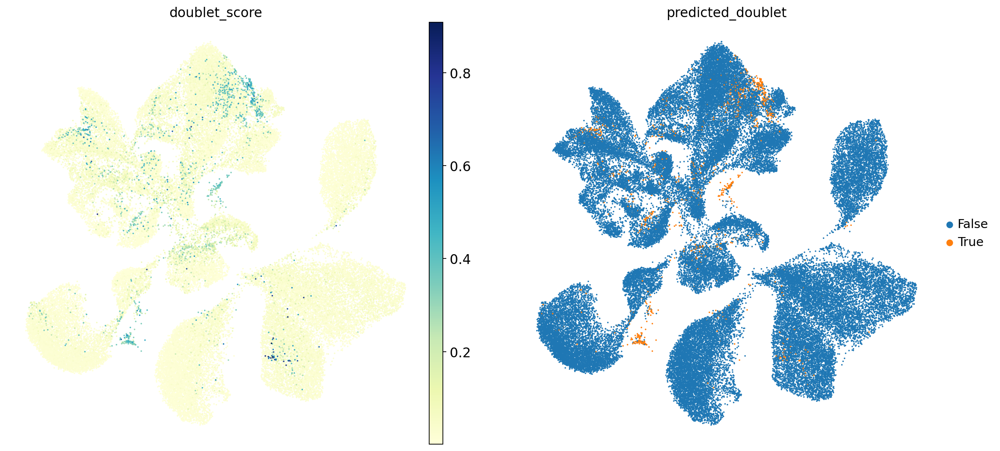

In [57]:
sc.pl.umap(adata, color=['doublet_score', 'predicted_doublet'], size=10)

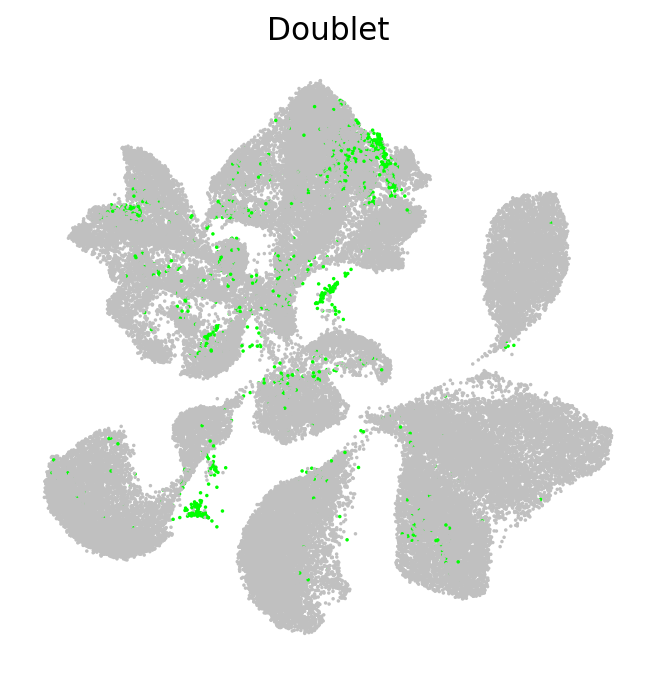

In [60]:
with rc_context({'font.size': 20.0, 'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color=['predicted_doublet'], legend_loc=None, title='Doublet', size=10,
              palette=['silver','lime'])

In [61]:
adata.write('./data/3GEX_processed.h5ad')

In [62]:
# load cell cycle genes
cell_cycle_genes = [x.strip() for x in open('/mnt/ibm_lg/laura.garcia/glioblastoma/analysis/pilot/multiome/cell_cycle/cell_cycle_genes.txt')]

# Define sets of genes
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]

In [63]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/data/laura.garcia/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [64]:
phase = ['palevioletred','turquoise', 'khaki']

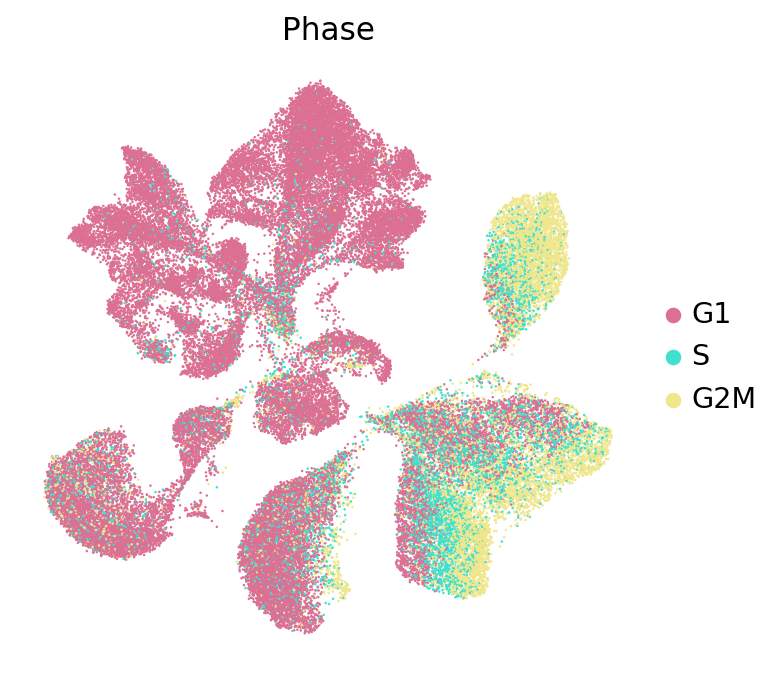

In [72]:
with rc_context({'font.size': 20.0, 'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='phase', size=5, palette =phase, title='Phase')

In [68]:
adata.obs['phase'].cat.reorder_categories(['G1','S','G2M'], inplace=True)

/tmp/ipykernel_69171/1144722337.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['phase'].cat.reorder_categories(['G1','S','G2M'], inplace=True)


In [73]:
adata.write('./data/3GEX_processed.h5ad')

----

In [2]:
adata = sc.read('./data/3GEX_processed.h5ad')

QC by sample

In [37]:
set(adata.obs['sample_r'])

{'EarlyC-1',
 'EarlyC-2',
 'EarlyP-1',
 'EarlyP-2',
 'EarlyP-3',
 'EarlyT-1',
 'EarlyT-2',
 'EarlyT-3',
 'GL261-1',
 'GL261-2',
 'GSC-1',
 'GSC-2',
 'GSC-3',
 'LateC-1',
 'LateC-2',
 'LateC-3',
 'LateP-1',
 'LateP-2',
 'LateT-1',
 'LateT-2',
 'LateT-3'}

In [38]:
order = ['EarlyC-1',
 'EarlyC-2',
 'EarlyP-1',
 'EarlyP-2',
 'EarlyP-3',
 'EarlyT-1',
 'EarlyT-2',
 'EarlyT-3',
          'LateC-1',
 'LateC-2',
 'LateC-3',
 'LateP-1',
 'LateP-2',
 'LateT-1',
 'LateT-2',
 'LateT-3',
        'GL261-1',
 'GL261-2',
 'GSC-1',
 'GSC-2',
 'GSC-3',]

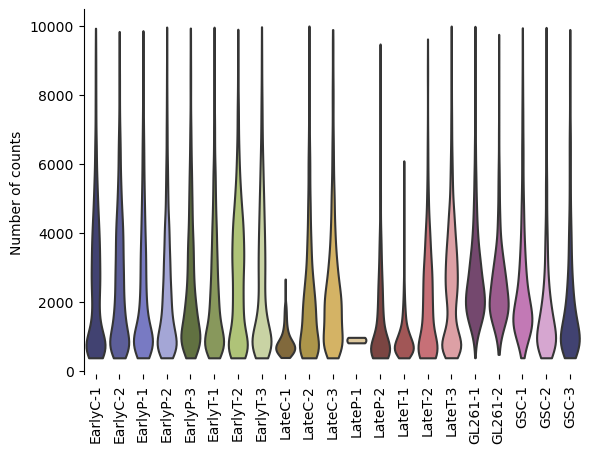

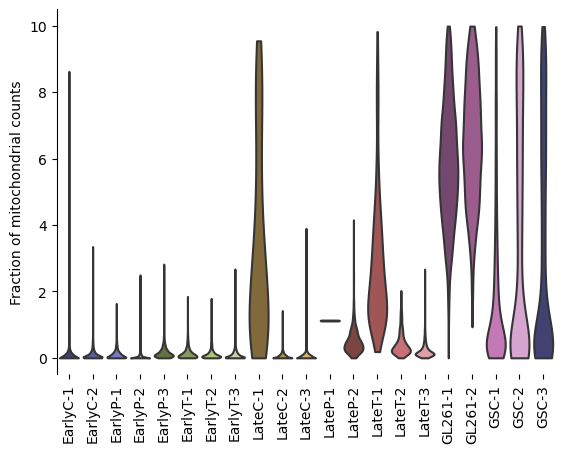

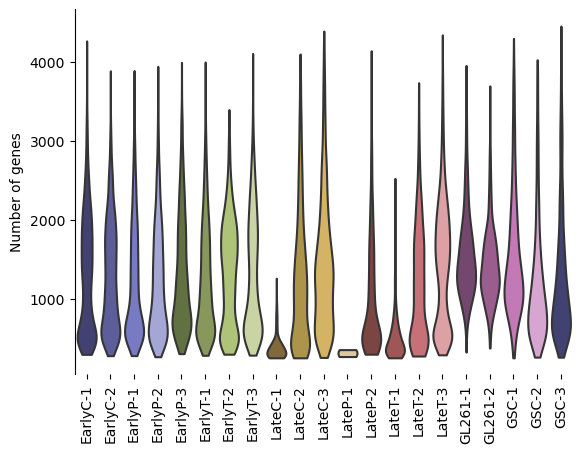

In [45]:
with rc_context({'font.size': 10.0, 'figure.figsize': (6, 5), 'xtick.labelsize' : 10,
                 'axes.spines.right': False, 'axes.spines.top': False, 'axes.spines.bottom': False,
                }):
    sc.pl.violin(adata, keys='total_counts', groupby='sample_r', palette='tab20b', stripplot=False, 
                 xlabel='', ylabel='Number of counts', rotation=90,
                order=order
                )
    
    sc.pl.violin(adata, keys='pct_counts_mt', groupby='sample_r', palette='tab20b', stripplot=False, 
                 xlabel='', ylabel='Fraction of mitochondrial counts', rotation=90,
                order=order)
    
    sc.pl.violin(adata, keys='n_genes_by_counts', groupby='sample_r', palette='tab20b', stripplot=False, 
                 xlabel='', ylabel='Number of genes', rotation=90,
                order=order)

## Subset glioblastoma cells 

Based on gene expression we can select the cluster that correspond to glioblastoma cells in the brain samples. The other samples (C,S) correspond to glioblastoma cells grown in culture. 

In [ ]:
#adata_glio =adata_gex[adata_gex.obs['leiden_res1'].isin(['5','6','3','4','21'])].copy()
adata_glio =adata_gex[adata_gex.obs['leiden_res1'].isin(['0','5','4'])].copy()
sc.pl.umap(adata_glio, color = 'donor')

In [ ]:
adata_glio.write('/mnt/ibm_lg/alejandro/multiome/glioblastoma/data/processed_objects/glioblastoma_cellsv2.h5ad')

## Export processed data as individual samples 

We re-compute the UMAP for each sample and export as individual h5ad 

In [ ]:
def quick_sc_clustering(adata_obj, n_pcs= 50):
    print('Neighbors....')
    sc.pp.neighbors(adata_obj, 
                   metric='cosine', 
                   n_neighbors= 30 , n_pcs=n_pcs )
    print('UMAP....')
    sc.tl.umap(adata_obj, min_dist=0.3)
    print('Leiden clusters....')
    sc.tl.leiden(adata_obj)

    return adata_obj

In [ ]:
# split adata object 
samples  = set(adata_gex.obs.donor)

for s in samples: 
    adata_sample = adata_gex[adata_gex.obs.donor ==s].copy() 
    adata_sample = quick_sc_clustering(adata_sample )
    sample_id = adata_sample.obs['donor'][0]
    
    adata_sample.write('/mnt/ibm_lg/alejandro/multiome/glioblastoma/data/samples_processed/' + sample_id + '.h5ad' )

In [ ]:
pwd

sc.pl.highest_expr_genes(adata_gex, n_top=20 )

# Control samples -- Injected brains with no treatment
Mar 3rd 2022 <br>
subset samples according to metadata. A and B are control brain (no drug) + glioblastoma cells 

In [ ]:
adata_brain_control =adata_gex[adata_gex.obs['donor'].isin(['A2','A5','A7','B1','B4','B9'])].copy()

In [ ]:
# Calculate the visualizations
sc.pp.pca(adata_brain_control, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_brain_control)
sc.tl.umap(adata_brain_control)

In [ ]:
sc.tl.leiden(adata_brain_control, resolution=0.5, key_added='leiden_control')

In [ ]:
sc.pl.umap(adata_brain_control, color = 'leiden_control')

In [ ]:
adata_brain_control.write('/mnt/ibm_lg/alejandro/multiome/glioblastoma/data/processed_objects/brain_control.h5ad')

In [ ]:
sc.pl.highest_expr_genes(adata_brain_control, n_top=20 )